## 0-1. GPU 사용 설정 및 경로 설정

In [1]:
!nvidia-smi

Fri Aug  8 00:21:58 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.133.20             Driver Version: 570.133.20     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   69C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


## 0-2. Ultralytics 설치

In [3]:
# 구글 Colab에서 실행할 경우

%pip install "ultralytics<=8.3.40" supervision roboflow
# prevent ultralytics from tracking your activity
!yolo settings sync=False
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 14914MiB)
Setup complete ✅ (4 CPUs, 14.6 GB RAM, 50.9/94.3 GB disk)


In [3]:
# GCP의 Colab Enterprise에서 실행할 경우

!pip install --upgrade ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 84.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 58.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 68.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 37.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

## 1-1. Roboflow의 haku 프로젝트에서 데이터셋 가져오기

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

from google.colab import userdata
from roboflow import Roboflow

!curl -L "https://app.roboflow.com/ds/5jogOMJNhl?key=oR2nAXcZDU" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
 extracting: train/images/IMG_5860_JPG.rf.0196ebd257c82bcf41e36da4860a3f6d.jpg  
 extracting: train/images/IMG_5860_JPG.rf.db7a0cead979fddbd983aa9fee48a2bd.jpg  
 extracting: train/images/IMG_5865_JPG.rf.107846464e58f7bd5ce2c5fd98adc009.jpg  
 extracting: train/images/IMG_5865_JPG.rf.f65bfb1fdcba5c6f3dc71bb3fb8c44fd.jpg  
 extracting: train/images/IMG_5866_JPG.rf.9af47a55c9a929fb7a3e00bcb8cb600c.jpg  
 extracting: train/images/IMG_5866_JPG.rf.f2f30a27a1be06e3e96ce3e0cefcebf3.jpg  
 extracting: train/images/IMG_5869_JPG.rf.c51f0a6e7e6565c68c102c7bfae03856.jpg  
 extracting: train/images/IMG_5869_JPG.rf.ffb1ad26f410734cfe0768d3b0bac349.jpg  
 extracting: train/images/IMG_5870_JPG.rf.2f5fa1e77576403982921eff40c1b77c.jpg  
 extracting: train/images/IMG_5870_JPG.rf.d66e48559f6846c4c82689bd353eabec.jpg  
 extracting: train/images/IMG_5876_JPG.rf.ad7ab1c6bd36269869afd099684a4918.jpg  
 extracting: train/images/IMG_5876_JPG.rf.f91e10e754085b8da725a1463f4d256

## 1-2. YOLO11을 이용하여 학습

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolo11s-seg.pt data=/content/datasets/data.yaml epochs=30 imgsz=640 plots=True # 20회 학습->30회로 변경

## 1-3. 학습 결과 확인

In [ ]:
HOME = "/content/runs" # HOME 경로 수정하기
print(HOME)

!ls {HOME}/segment/train2/

/content/runs
args.yaml					    results.png
BoxF1_curve.png					    train_batch0.jpg
BoxP_curve.png					    train_batch1860.jpg
BoxPR_curve.png					    train_batch1861.jpg
BoxR_curve.png					    train_batch1862.jpg
confusion_matrix_normalized.png			    train_batch1.jpg
confusion_matrix.png				    train_batch2.jpg
events.out.tfevents.1754453750.2ec86305fd3b.4214.0  val_batch0_labels.jpg
labels_correlogram.jpg				    val_batch0_pred.jpg
labels.jpg					    val_batch1_labels.jpg
MaskF1_curve.png				    val_batch1_pred.jpg
MaskP_curve.png					    val_batch2_labels.jpg
MaskPR_curve.png				    val_batch2_pred.jpg
MaskR_curve.png					    weights
results.csv


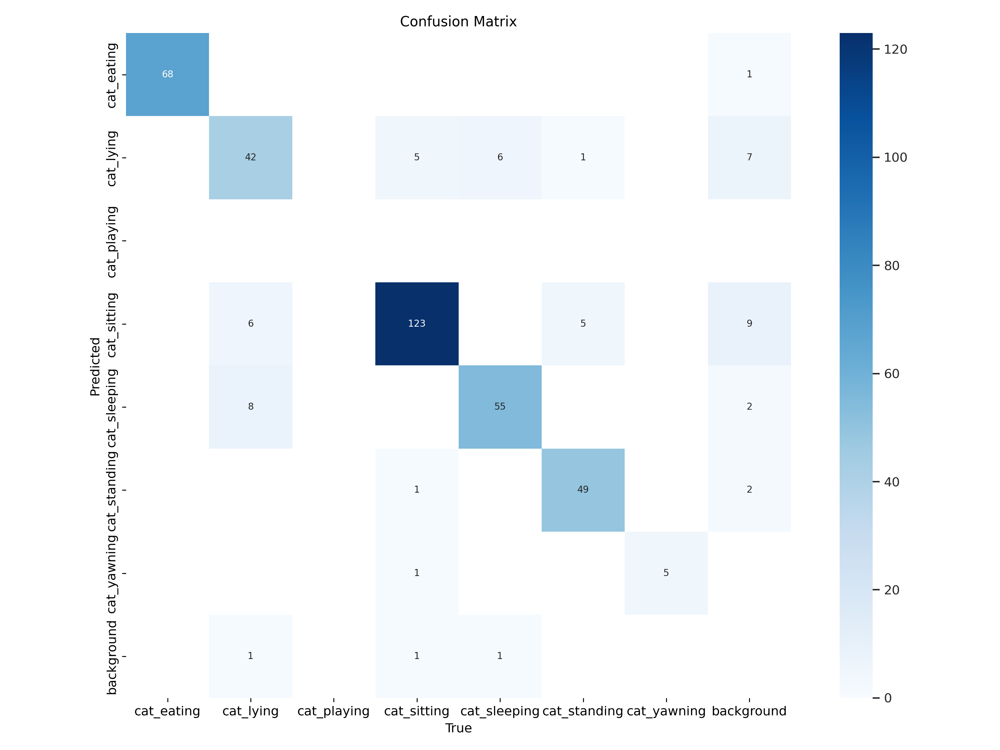

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/segment/train2/confusion_matrix.png', width=600) # 이하 경로 모두 수정하기

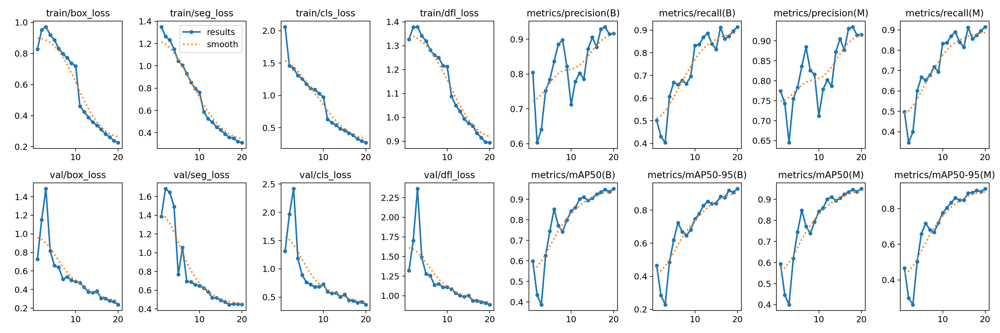

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/segment/train2/results.png', width=600)

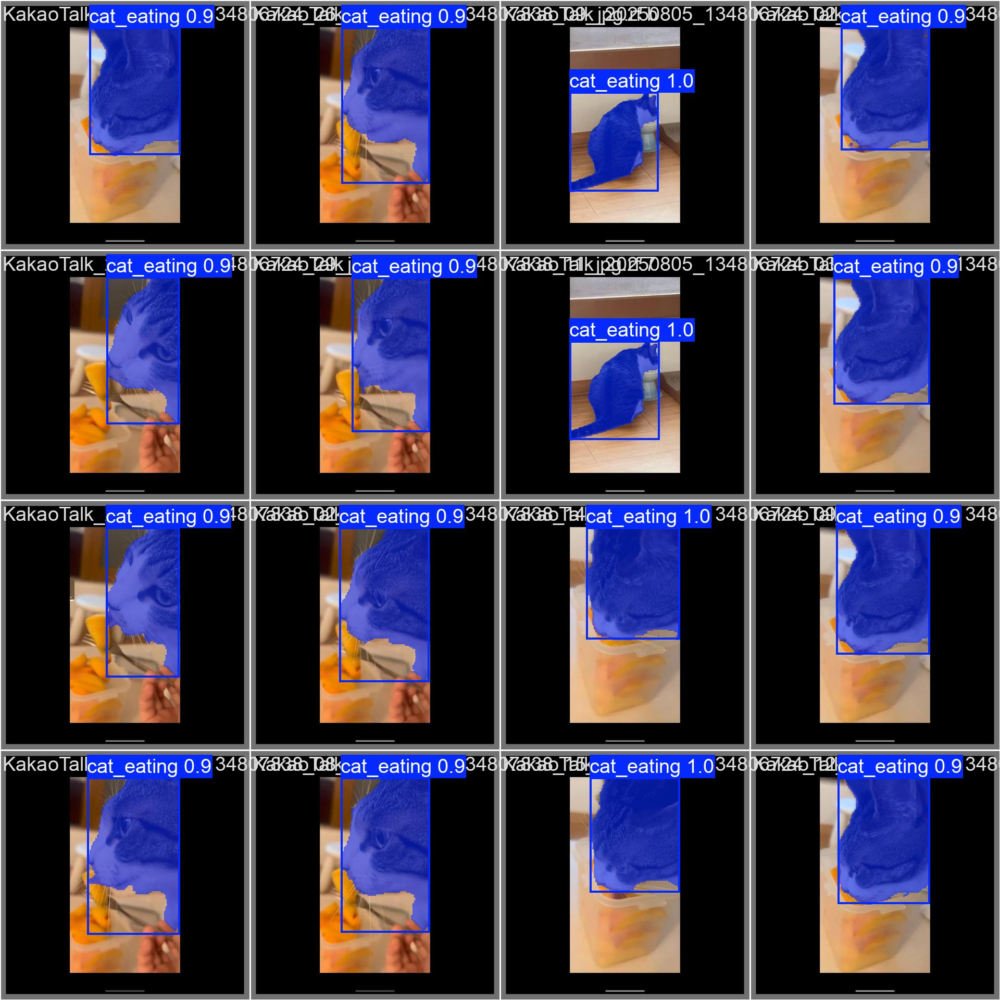

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/segment/train2/val_batch0_pred.jpg', width=600)

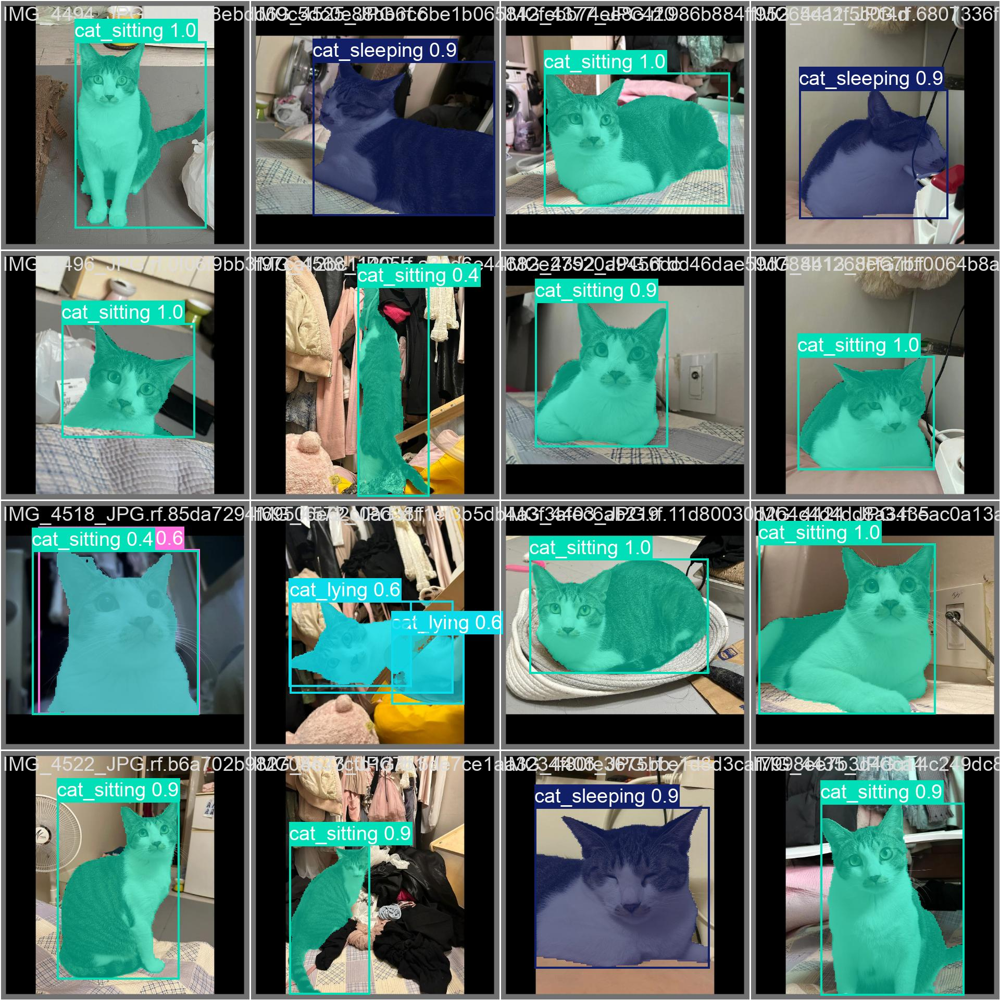

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/segment/train2/val_batch2_pred.jpg', width=600)

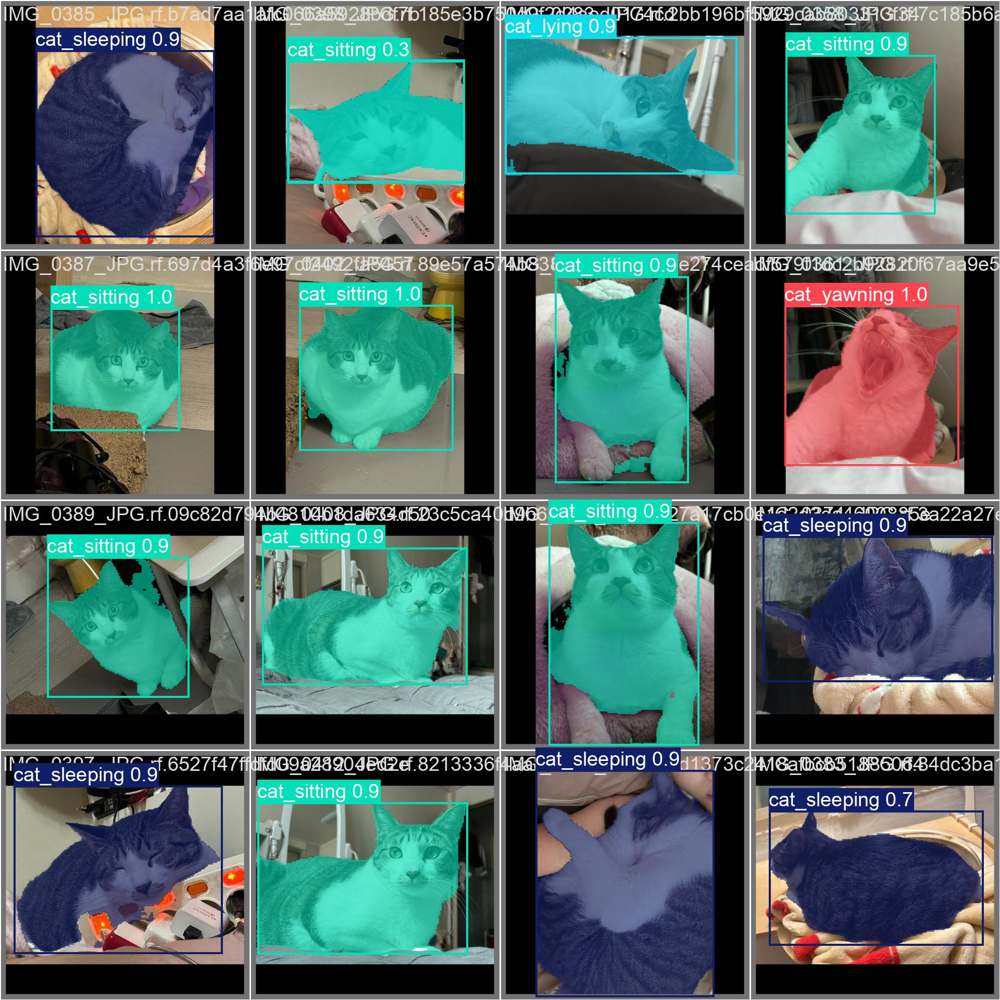

In [ ]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/segment/val/val_batch2_pred.jpg', width=600)

## 1-4. 모델 검증

In [ ]:
!yolo task=detect mode=val model={HOME}/segment/train2/weights/best.pt data=/content/datasets/data.yaml

WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,069,525 parameters, 0 gradients, 35.3 GFLOPs
val: Scanning /content/datasets/valid/labels.cache... 371 images, 1 backgrounds, 0 corrupt: 100% 371/371 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 24/24 [00:08<00:00,  2.71it/s]
                   all        371        378      0.916      0.915      0.951      0.929      0.916      0.915      0.951       0.91
            cat_eating         68         68      0.981          1      0.988      0.978      0.981          1      0.988       0.98
             cat_lying         53         57      0.774      0.737      0.849      0.804      0.774      0.737      0.849      0.7

## 1-5. 테스트 이미지 업로드

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!yolo task=detect mode=predict model={HOME}/segment/train2/weights/best.pt conf=0.25 source=/content/drive/MyDrive/Images save=True

WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,069,525 parameters, 0 gradients, 35.3 GFLOPs

image 1/8 /content/drive/MyDrive/Images/KakaoTalk_20250806_142002937.jpg: 480x640 1 cat_sleeping, 56.8ms
image 2/8 /content/drive/MyDrive/Images/KakaoTalk_20250806_142002937_01.jpg: 480x640 1 cat_sitting, 16.1ms
image 3/8 /content/drive/MyDrive/Images/image (1).png: 448x640 1 cat_yawning, 59.7ms
image 4/8 /content/drive/MyDrive/Images/image (2).png: 352x640 1 cat_lying, 1 cat_standing, 60.3ms
image 5/8 /content/drive/MyDrive/Images/image (3).png: 480x640 1 cat_standing, 16.8ms
image 6/8 /content/drive/MyDrive/Images/image (4).png: 640x448 1 cat_lying, 92.5ms
image 7/8 /content/drive/MyDrive/Images/image (5).png: 640x576 1 cat_sitting, 88.7ms
image 8/8 /content/drive/MyDrive/Imag

## 1-6. 결과 확인

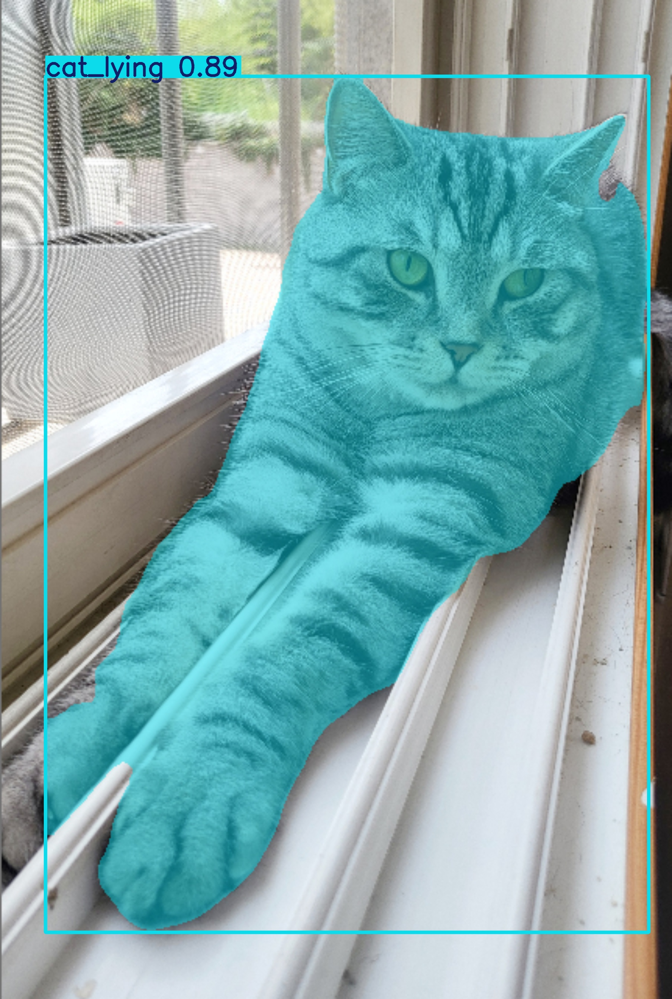

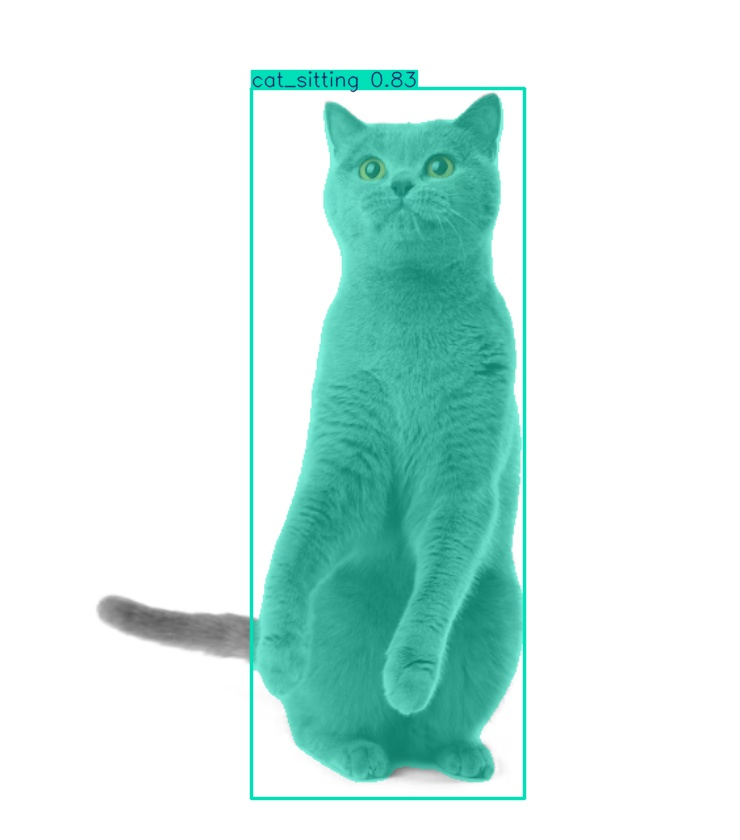

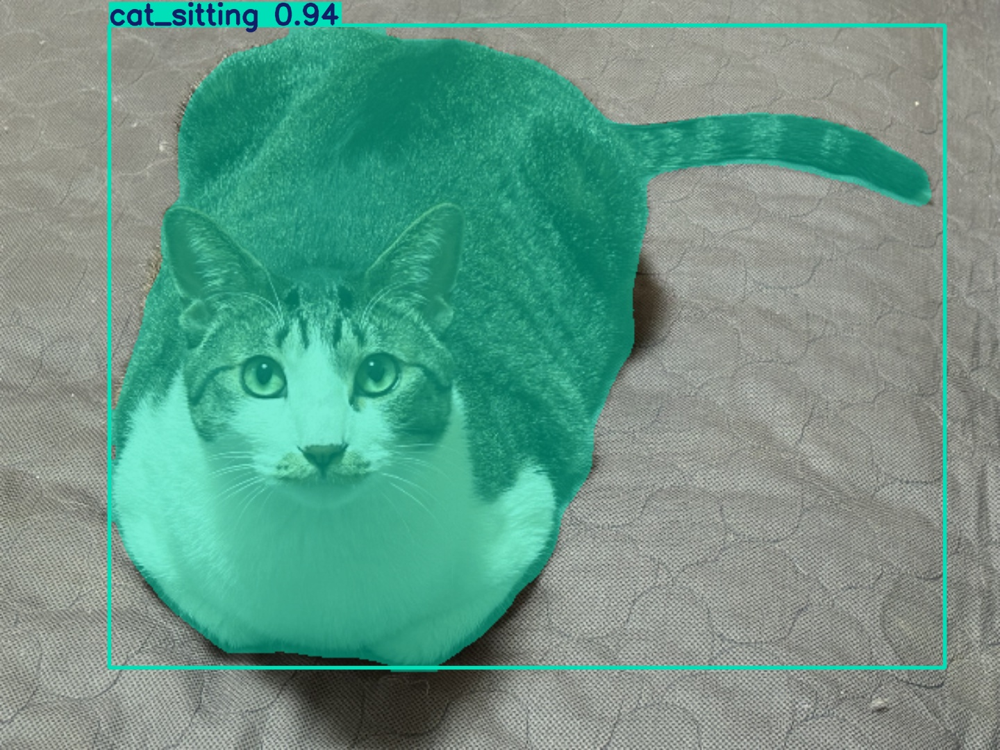

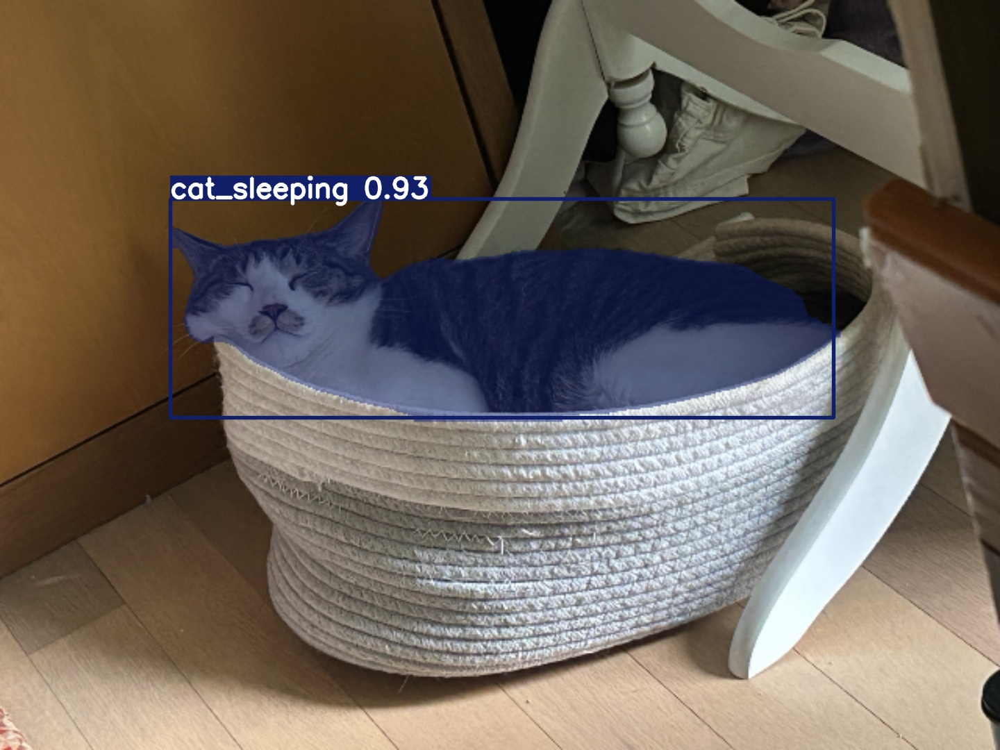

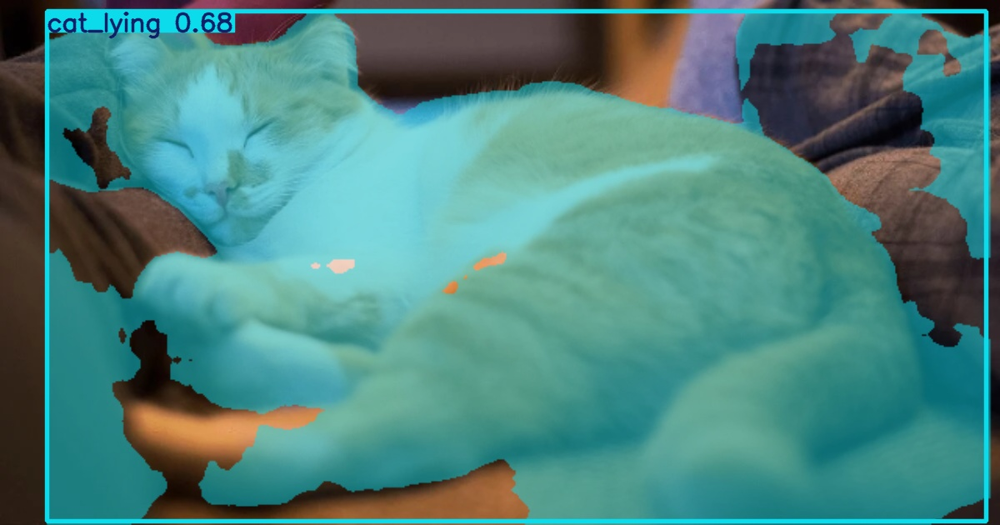

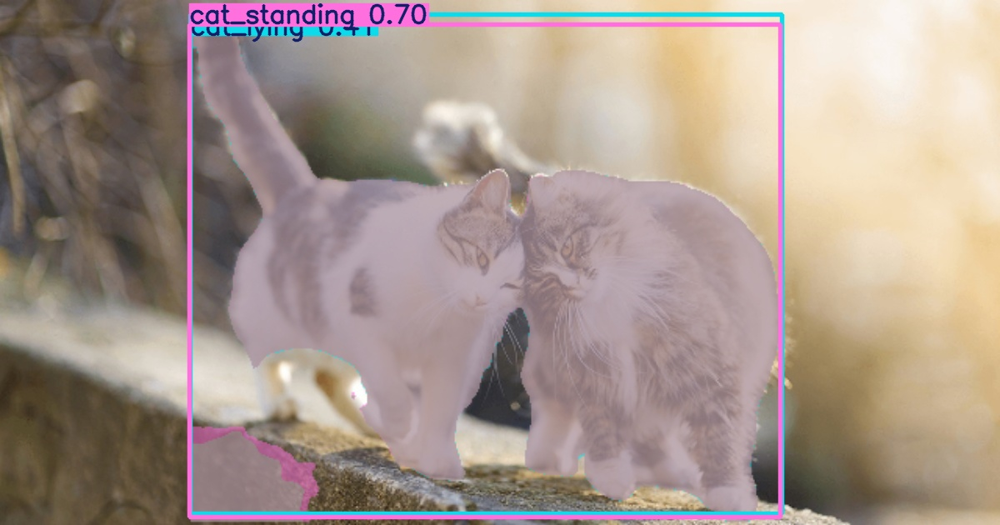

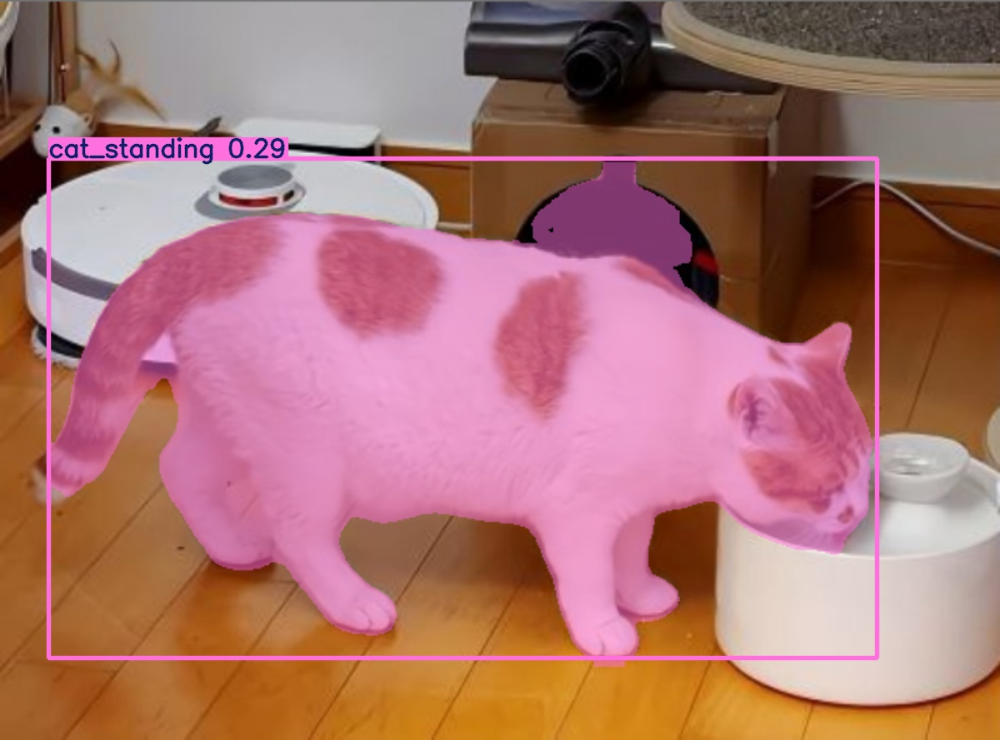

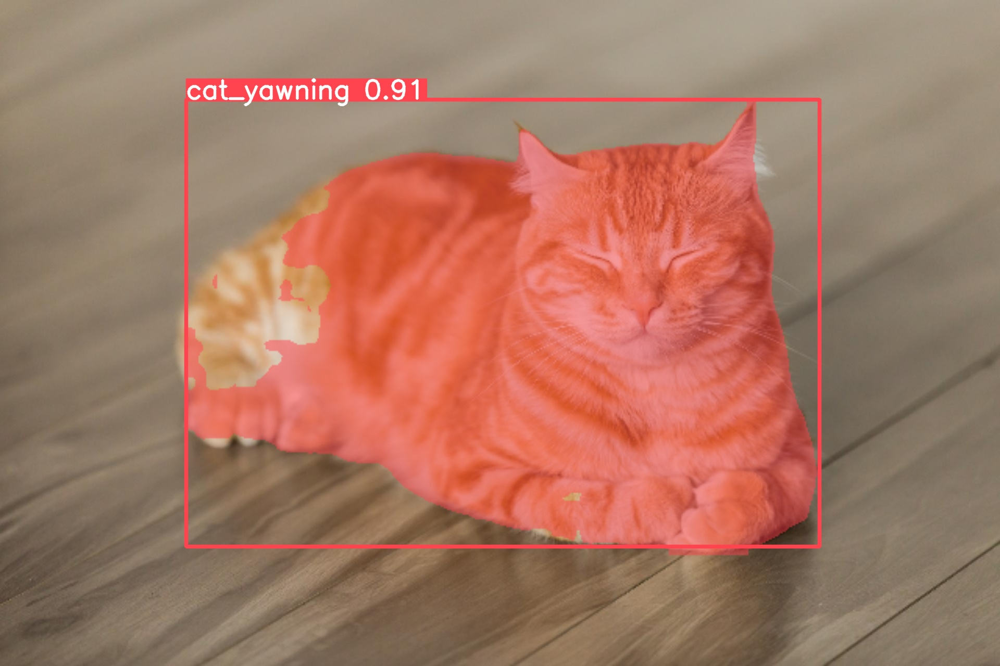

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = f'{HOME}/segment/predict3/'
for img in glob.glob(f'{latest_folder}/*.jpg')[:8]:
    display(IPyImage(filename=img, width=600))
    print("\n")

## 2-1. 하쿠 + 낯선 고양이 이미지 데이터셋 불러오기

In [4]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.9/86.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 93.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 98.0 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.18.0 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.

In [5]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

from google.colab import userdata
from roboflow import Roboflow

# !curl -L "https://app.roboflow.com/ds/agOXuqPahH?key=Yc83qfXBWm" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip # haku는 segmentation, cat은 박스형으로만 된 데이터셋
!curl -L "https://app.roboflow.com/ds/W5wjUxtrGn?key=CHOHqatRsA" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip # haku와 cat이 segmentation으로 된 데이터셋

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: train/labels/000180_jpg.rf.1cee667de639b5696a4550ca5b9f0e0d.txt  
  inflating: train/labels/000181_jpg.rf.623210b4a7ecb46242bb33bf4a536376.txt  
  inflating: train/labels/000181_jpg.rf.7b098d60af00d59299c97ce0d4064bcd.txt  
  inflating: train/labels/000182_jpg.rf.400060990967e91db24b95f59a9fb91f.txt  
  inflating: train/labels/000182_jpg.rf.519926e7c461f41bc06a5fcd6d56549c.txt  
  inflating: train/labels/000183_jpeg.rf.6983aa8af74339aafbc369ad83eb2737.txt  
  inflating: train/labels/000183_jpeg.rf.c698ff188fa2659ee99677b29b1a9561.txt  
  inflating: train/labels/000183_jpg.rf.072de3d80e7eafd2fbc19b84fe1a7101.txt  
  inflating: train/labels/000183_jpg.rf.9c620a7f90cd9622321923c664dec362.txt  
  inflating: train/labels/000185_jpg.rf.4e31519e379b699c0883b06aa4e3addf.txt  
  inflating: train/labels/000185_jpg.rf.7714b3a6e91c85daf253540cf09412cc.txt  
  inflating: train/labels/000187_jpg.rf.7aa44590943fbbf2fcb2a34c6ac7fb93.txt  
  inflating: t

## 2-2. 병합된 데이터를 YOLO11을 이용하여 학습

In [6]:
%cd {HOME}

# !yolo task=detect mode=train model=yolo11s.pt data=/content/datasets/data.yaml epochs=20 imgsz=640 plots=True # 임시 박스형 대체 코드
!yolo task=detect mode=train model=yolo11s-seg.pt data=/content/datasets/data.yaml epochs=30 imgsz=640 plots=True # cat 데이터 세그멘테이션 완료하면 실행할 것

/content
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 14914MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0,

## 2-3. 학습 결과 확인

In [7]:
HOME = "/content/runs" # HOME 경로 수정하기
print(HOME)

#!ls {HOME}/detect/train/
!ls {HOME}/segment/train/

/content/runs
args.yaml			 MaskP_curve.png      train_batch5422.jpg
BoxF1_curve.png			 MaskPR_curve.png     val_batch0_labels.jpg
BoxP_curve.png			 MaskR_curve.png      val_batch0_pred.jpg
BoxPR_curve.png			 results.csv	      val_batch1_labels.jpg
BoxR_curve.png			 results.png	      val_batch1_pred.jpg
confusion_matrix_normalized.png  train_batch0.jpg     val_batch2_labels.jpg
confusion_matrix.png		 train_batch1.jpg     val_batch2_pred.jpg
labels_correlogram.jpg		 train_batch2.jpg     weights
labels.jpg			 train_batch5420.jpg
MaskF1_curve.png		 train_batch5421.jpg


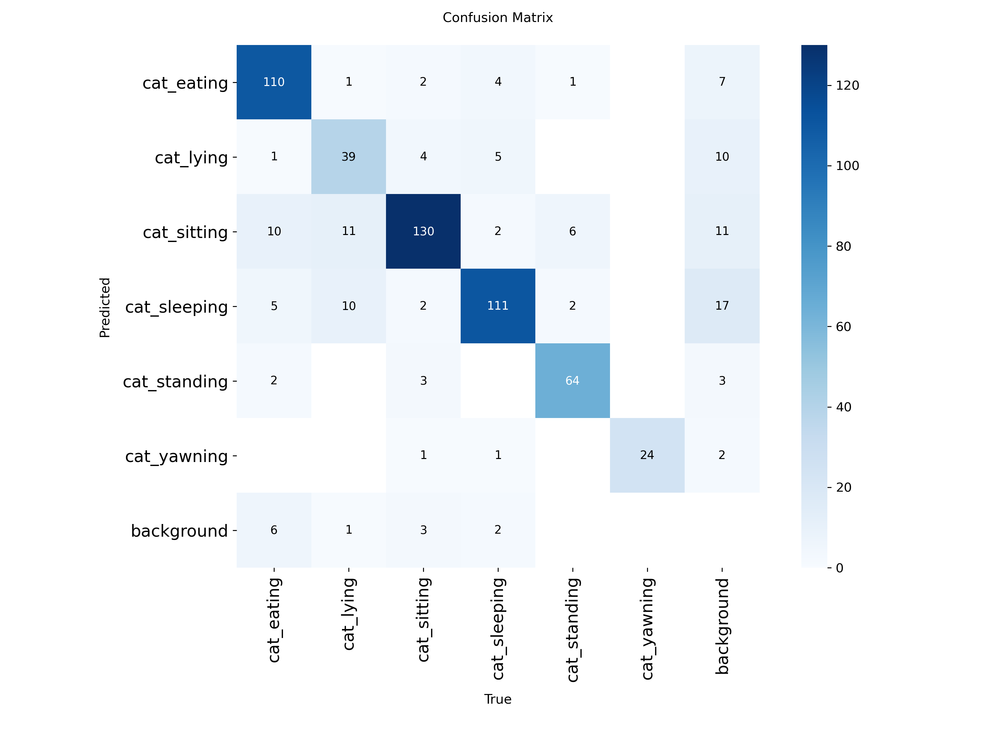

In [8]:
from IPython.display import Image as IPyImage

#IPyImage(filename=f'{HOME}/detect/train/confusion_matrix.png', width=600) # 이하 경로 모두 수정하기
IPyImage(filename=f'{HOME}/segment/train/confusion_matrix.png', width=600)

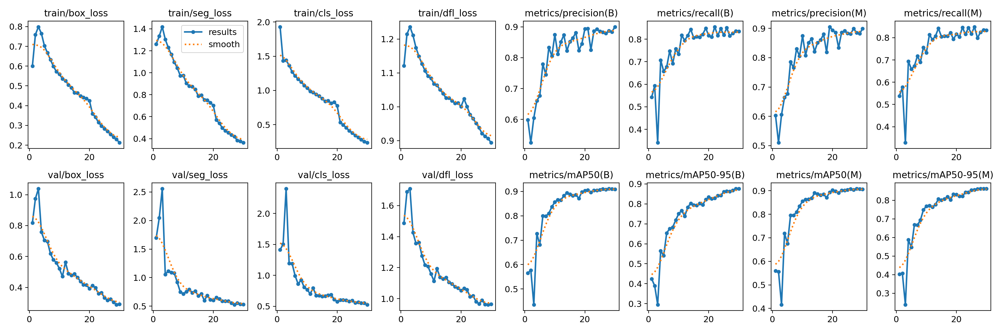

In [9]:
from IPython.display import Image as IPyImage

#IPyImage(filename=f'{HOME}/detect/train/results.png', width=600)
IPyImage(filename=f'{HOME}/segment/train/results.png', width=600)

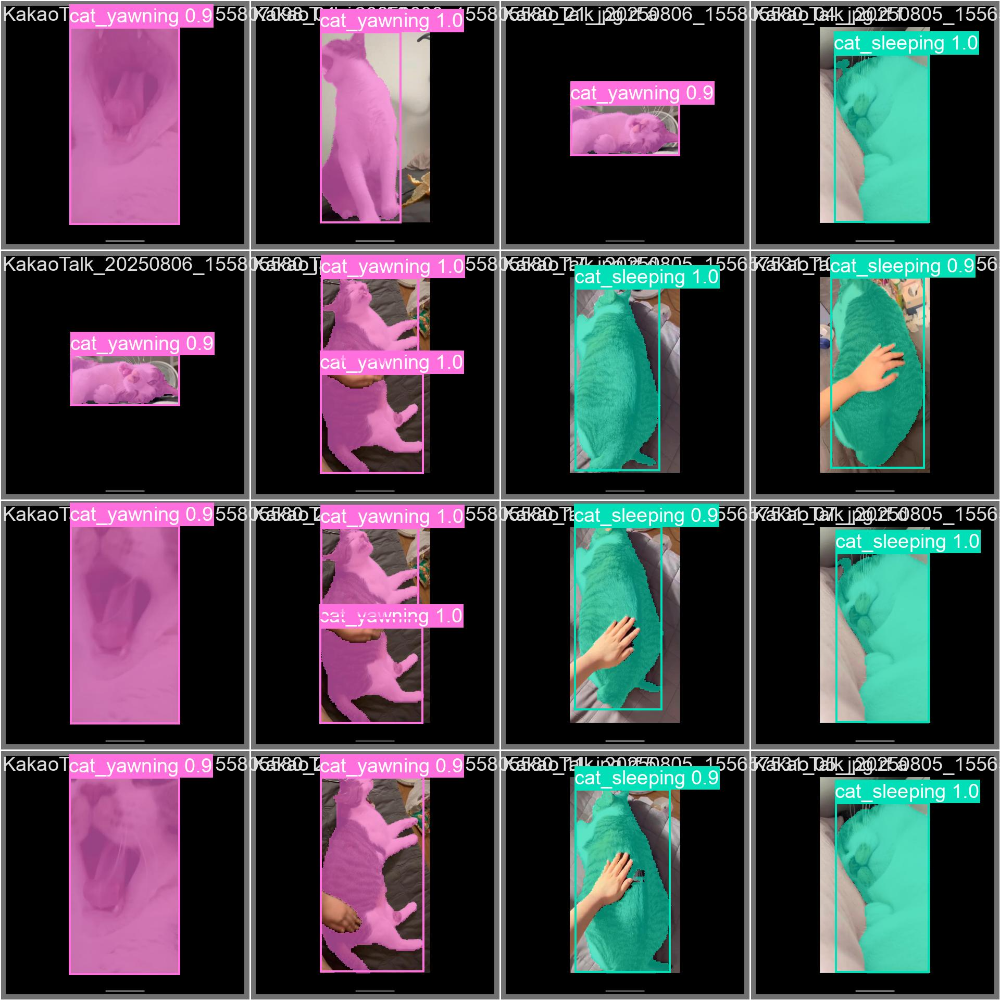

In [ ]:
from IPython.display import Image as IPyImage

#IPyImage(filename=f'{HOME}/detect/train/val_batch0_pred.jpg', width=600)
IPyImage(filename=f'{HOME}/segment/train/val_batch0_pred.jpg', width=600)

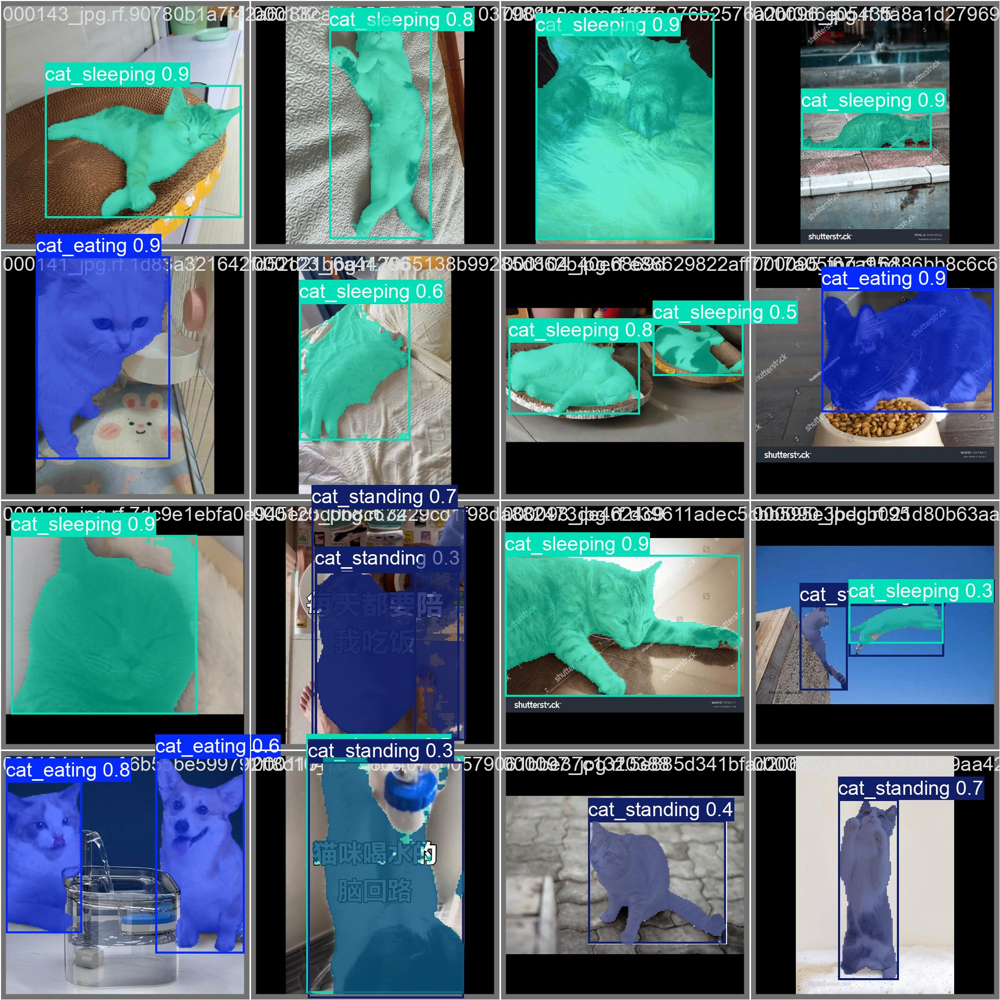

In [ ]:
from IPython.display import Image as IPyImage

#IPyImage(filename=f'{HOME}/detect/train/val_batch1_pred.jpg', width=600)
IPyImage(filename=f'{HOME}/segment/train/val_batch1_pred.jpg', width=600)

## 2-4. 모델 검증

In [ ]:
#!yolo task=detect mode=val model={HOME}/detect/train/weights/best.pt data=/content/datasets/data.yaml
!yolo task=detect mode=val model={HOME}/segment/train/weights/best.pt data=/content/datasets/data.yaml

WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,069,138 parameters, 0 gradients, 35.3 GFLOPs
val: Scanning /content/datasets/valid/labels.cache... 542 images, 1 backgrounds, 0 corrupt: 100% 542/542 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 34/34 [00:12<00:00,  2.83it/s]
                   all        542        563      0.893      0.845       0.91      0.871      0.891      0.844      0.908      0.858
            cat_eating        127        134      0.937      0.866      0.956      0.899      0.929      0.858      0.943        0.9
             cat_lying         58         62      0.832      0.645      0.787      0.736      0.832      0.645      0.787      0.7

## 2-5. 테스트 이미지 업로드

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!yolo task=detect mode=predict model={HOME}/detect/train/weights/best.pt conf=0.25 source=/content/drive/MyDrive/Images save=True
!yolo task=detect mode=predict model={HOME}/segment/train/weights/best.pt conf=0.25 source=/content/drive/MyDrive/Images save=True

WARNING ⚠️ conflicting 'task=detect' passed with 'task=segment' model. Ignoring 'task=detect' and updating to 'task=segment' to match model.
Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,069,138 parameters, 0 gradients, 35.3 GFLOPs

image 1/8 /content/drive/MyDrive/Images/KakaoTalk_20250806_142002937.jpg: 480x640 1 cat_sleeping, 59.2ms
image 2/8 /content/drive/MyDrive/Images/KakaoTalk_20250806_142002937_01.jpg: 480x640 1 cat_sitting, 16.1ms
image 3/8 /content/drive/MyDrive/Images/image (1).png: 448x640 1 cat_sitting, 1 cat_sleeping, 56.2ms
image 4/8 /content/drive/MyDrive/Images/image (2).png: 352x640 1 cat_standing, 61.9ms
image 5/8 /content/drive/MyDrive/Images/image (3).png: 480x640 1 cat_eating, 16.8ms
image 6/8 /content/drive/MyDrive/Images/image (4).png: 640x448 1 cat_lying, 55.1ms
image 7/8 /content/drive/MyDrive/Images/image (5).png: 640x576 1 cat_standing, 55.6ms
image 8/8 /content/drive/MyDrive/Im

## 2-6. 결과 확인

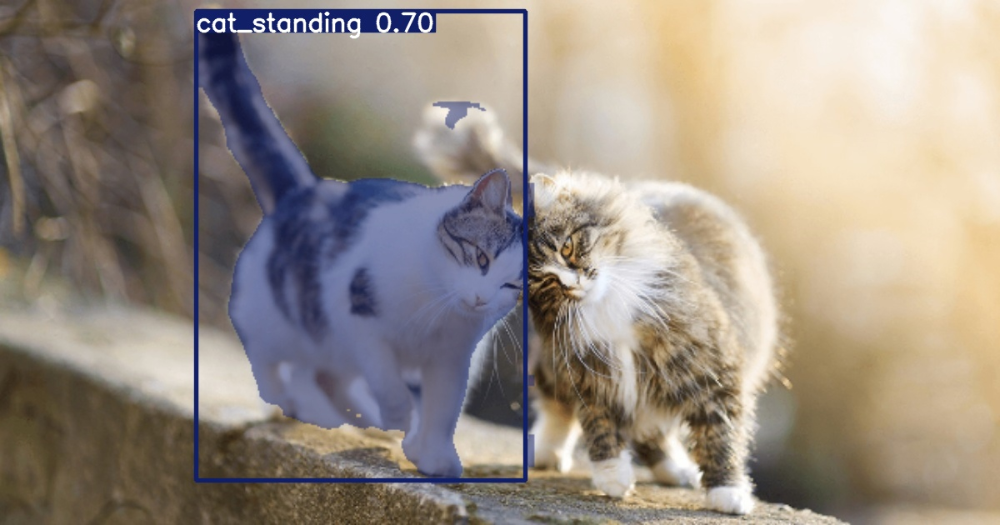

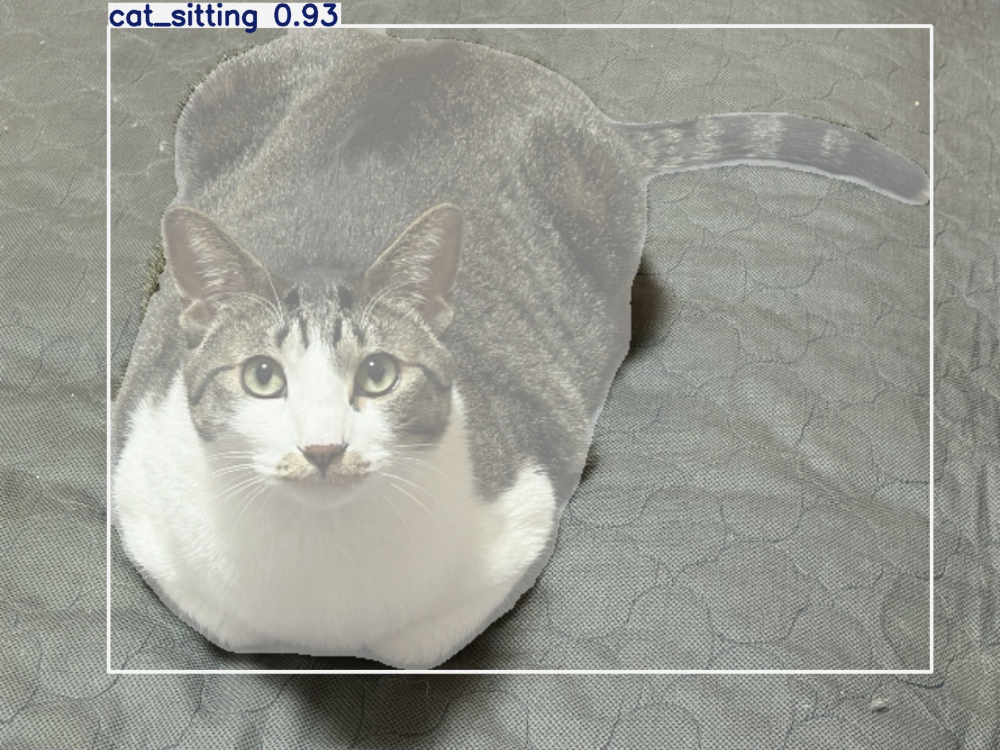

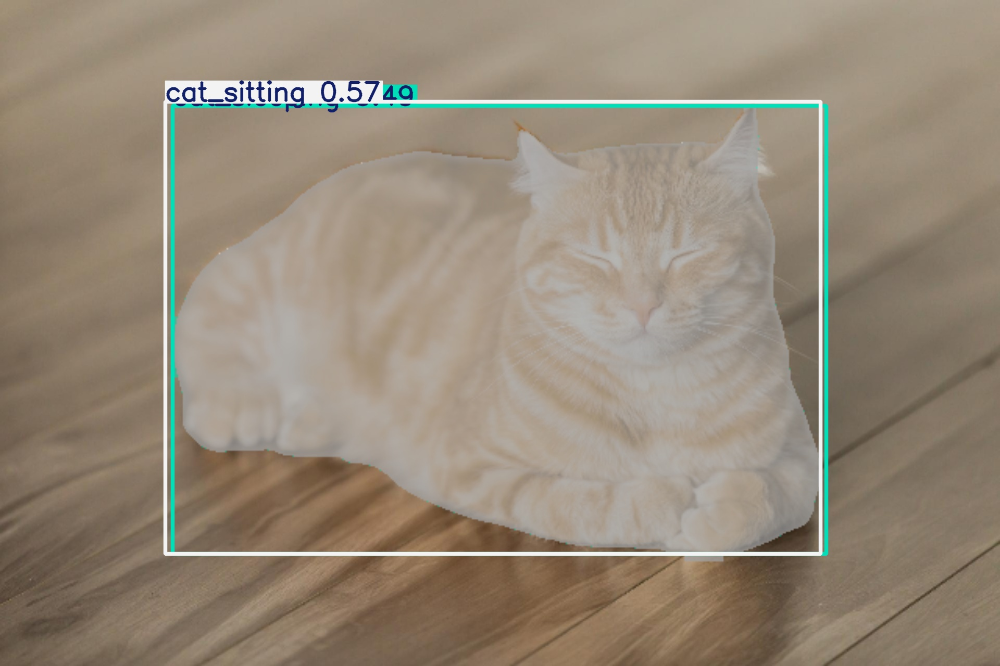

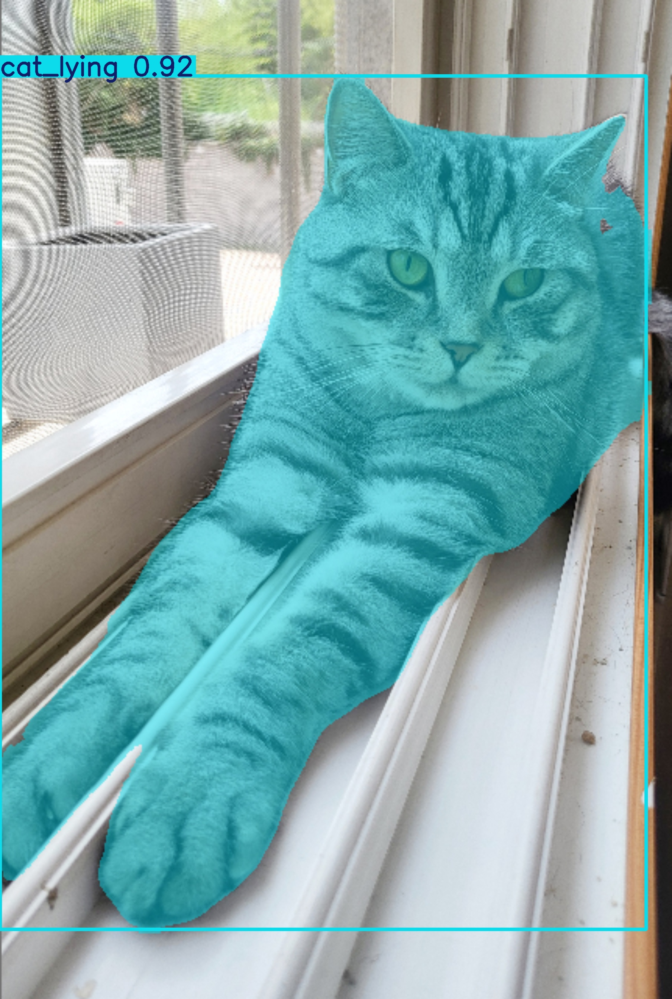

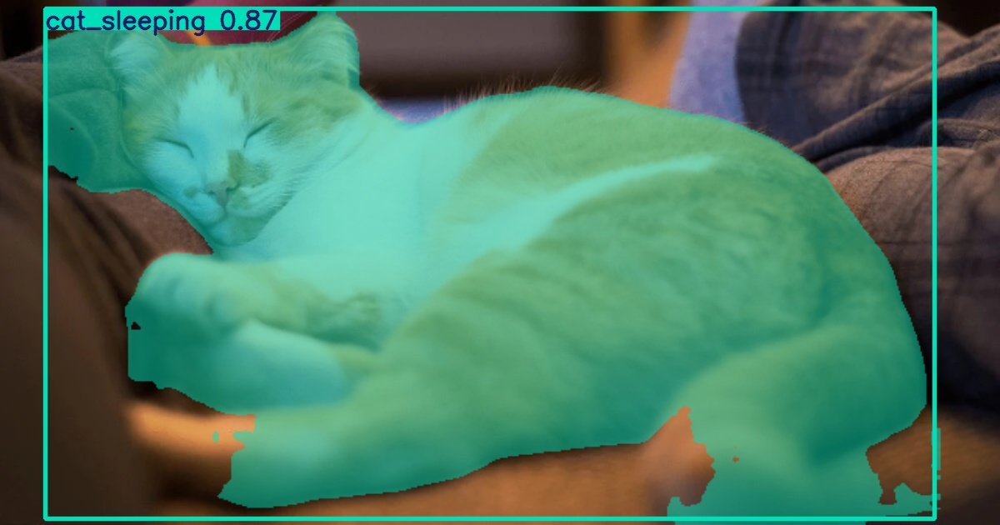

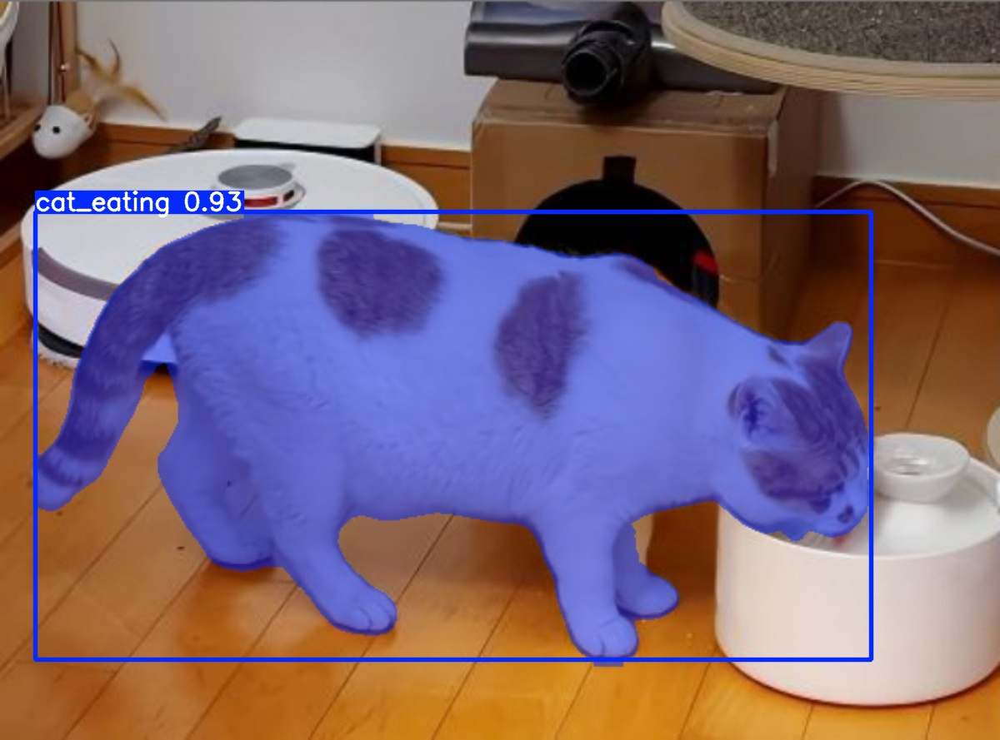

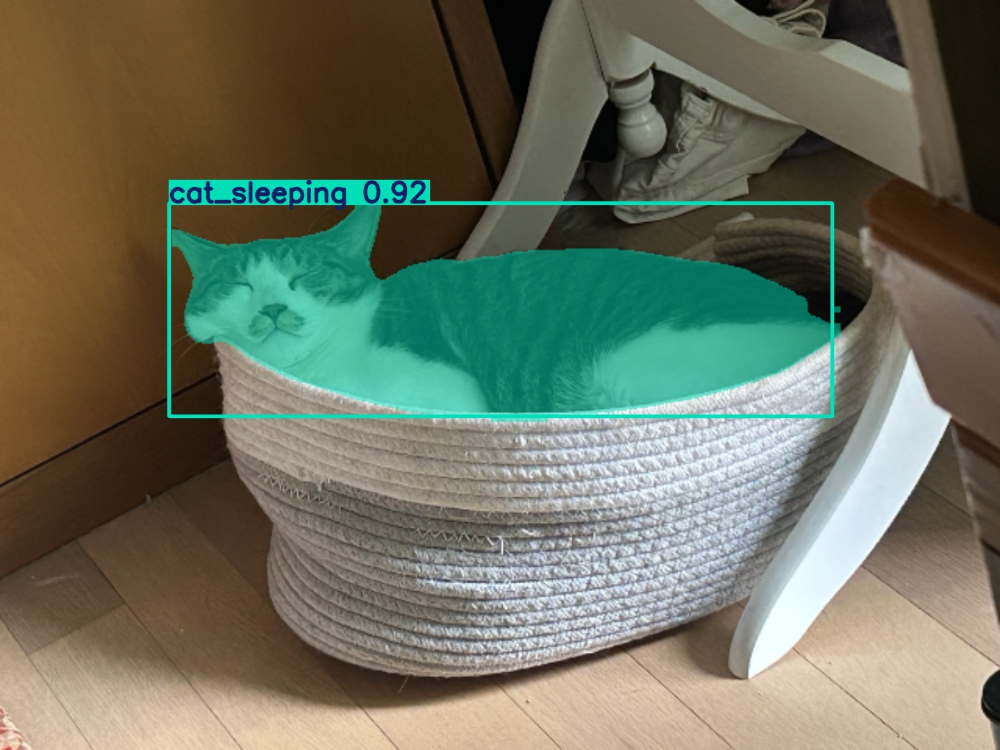

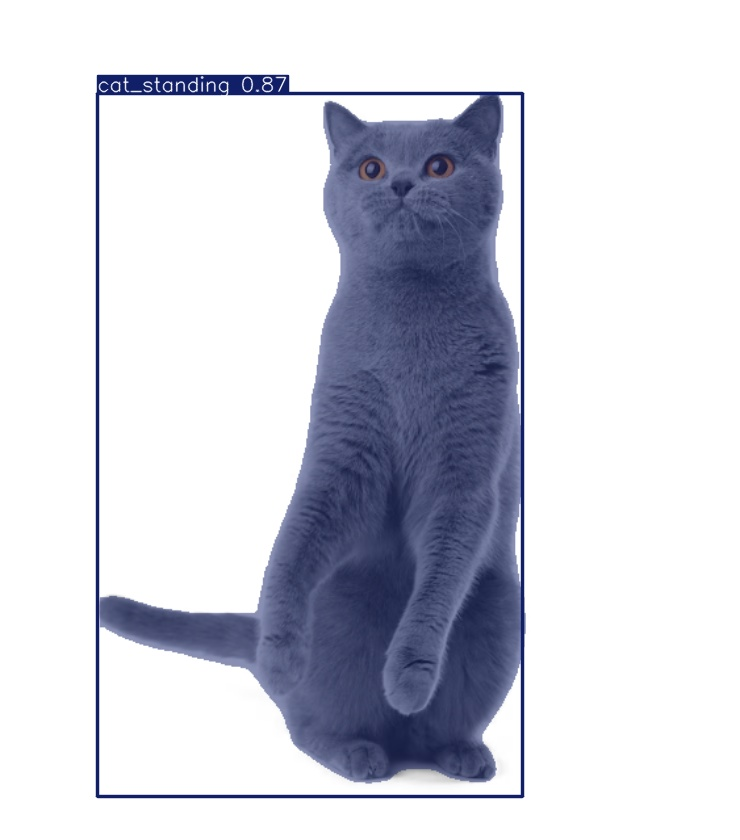

In [ ]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = f'{HOME}/segment/predict/' # detect 또는 segment 변경
for img in glob.glob(f'{latest_folder}/*.jpg')[:8]:
    display(IPyImage(filename=img, width=600))
    print("\n")